# SpatialMouse - Downstream analysis of deconvolved Kidney tissue section

The Kidney section has been selected and deconvolved in `SpatialMouse_07_deconvolution_cell2location_Kidney.ipynb`

- Followed this tutorial: https://docs.scvi-tools.org/en/stable/tutorials/notebooks/cell2location_lymph_node_spatial_tutorial.html
- More updated tutorial here: https://github.com/BayraktarLab/cell2location/blob/master/docs/notebooks/cell2location_tutorial.ipynb

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
## Import the custom library
import os
import sys

# add xDbit toolbox path to path variable
module_path = os.path.abspath("../../")
if module_path not in sys.path:
    sys.path.append(module_path)

import xdbit_funcs as db

# import other packages
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path
import seaborn as sns
import scvi
import cell2location

Global seed set to 0


In [3]:
plt.rcParams['figure.dpi'] = 80
plt.style.use('default')

## Set results directory

In [4]:
data_dir = "out"
results_folder = os.path.join(data_dir, "deconvolution")

# create model path if necessary
Path(results_folder).mkdir(parents=True, exist_ok=True)

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = os.path.join(results_folder, 'reference_signatures')
run_name = os.path.join(results_folder, 'cell2location_map')

# Analyze results

### Reload model

In [5]:
adata_file = os.path.join(run_name, "sp.h5ad")
stadata = sc.read_h5ad(adata_file)
st_model = cell2location.models.Cell2location.load(run_name, stadata)

INFO     File out/deconvolution/cell2location_map/model.pt already downloaded                
INFO     Preparing underlying module for load                                                


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/lustre/groups/hpc/meier_lab/.conda/envs/gpu/lib/python3.8/site-packages/pytorch_lightning/trainer/configuration_validator.py:120: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Set SLURM handle signals.
/lustre/groups/hpc/meier_lab/.conda/envs/gpu/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:432: UserWarning: The number of training samples (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/30000:   0%|          | 0/30000 [00:00<?, ?it/s]

/lustre/groups/hpc/meier_lab/.conda/envs/gpu/lib/python3.8/site-packages/torch/distributions/gamma.py:71: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /lustre/groups/hpc/meier_lab/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755903507/work/aten/src/ATen/native/cuda/jit_utils.cpp:860.)
  self.rate * value - torch.lgamma(self.concentration))


Epoch 1/30000:   0%|          | 1/30000 [00:17<148:40:33, 17.84s/it, v_num=1, elbo_train=1.8e+7]


In [6]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
# this has to be repeated after the reload
stadata = st_model.export_posterior(
    stadata, sample_kwargs={'num_samples': 1000, 
                            'batch_size': st_model.adata.n_obs, 
                            'use_gpu': True}
)

Sampling global variables, sample: 100%|██████████| 999/999 [00:13<00:00, 73.45it/s]


#### Assessing mapping quality

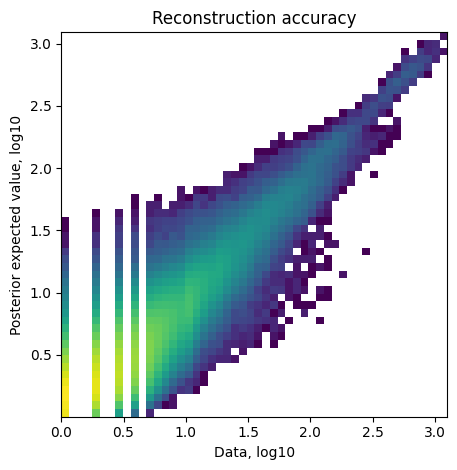

In [7]:
st_model.plot_QC()

## Visualizing cell abundance in spatial coordinates

Note: We use 5% quantile of the posterior distribution, representing the value of cell abundance that the model has high confidence in (aka 'at least this amount is present'). 

In [8]:
# dictionary to rename abbreviations into full names
rename_dict = {
    "DCT": "Distal convoluted tubules",
    "Early PT": "Early proximal tubules",
    "Endo": "Endothelial cells",
    "IC": "Collecting duct intercalated cells",
    "LOH": "Loop of Henle",
    "Macro": "Macrophages",
    "NP": "Nephron progenitors",
    "Neutro": "Neutrophils",
    "PC": "Collecting duct principal cells",
    "PCT": "Proximal convoluted tubules",
    "PST": "Proximal straight tubules",
    "Podo": "Podocytes",
    "Proliferating": "Proliferating cells",
    "Stroma 1": "Stromal cells 1",
    "Stroma 2": "Stromal cells 2"
}

In [9]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
stadata.uns['mod']['factor_names'] = [rename_dict[elem] if elem in rename_dict else elem for elem in stadata.uns['mod']['factor_names']]
stadata.obs[stadata.uns['mod']['factor_names']] = stadata.obsm['q05_cell_abundance_w_sf']

# get list of celltypes
celltypes = stadata.uns['mod']['factor_names']

Saving figure to file figures/spatial_cell2location_celltypes.pdf
Saved.


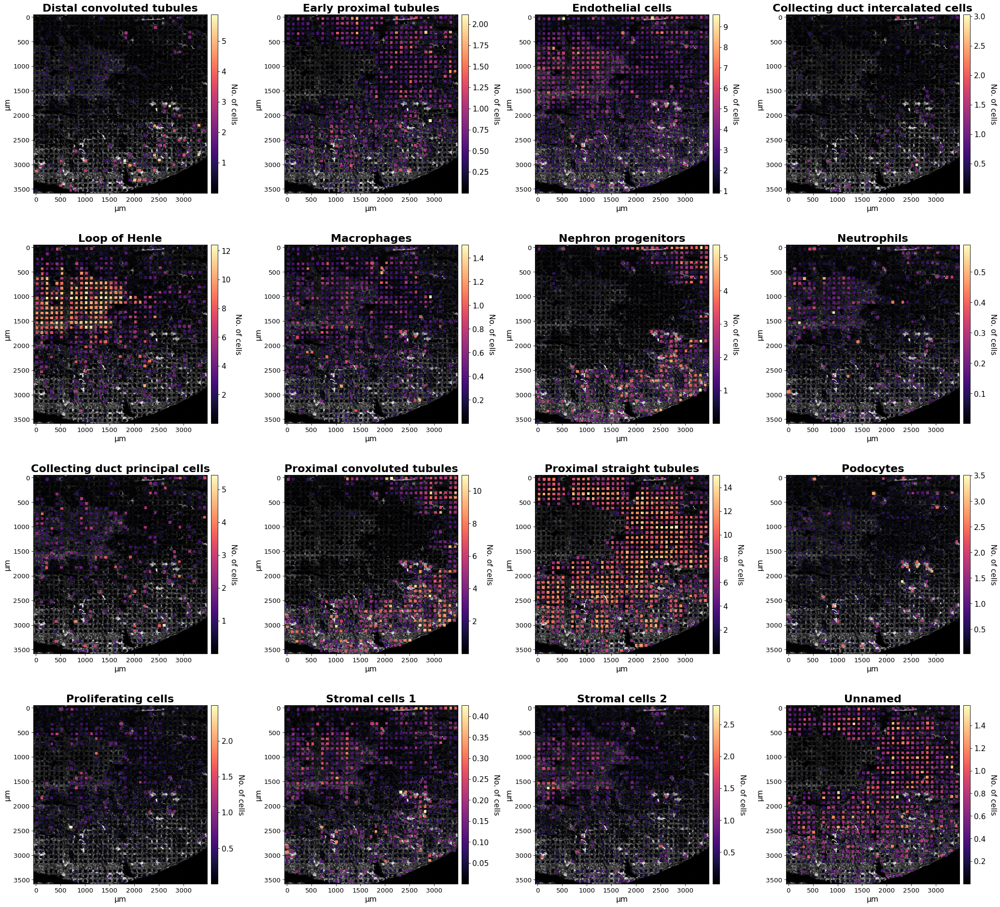

In [12]:
db.pl.spatial(stadata, 
              keys=celltypes, 
              groupby='id',
              image_key='phalloidin', clb_title="No. of cells",
              cmap='magma', alpha=1, clb_pad=0.05, figsize=(6.5,6),
              savepath="figures/spatial_cell2location_celltypes.pdf"
             )

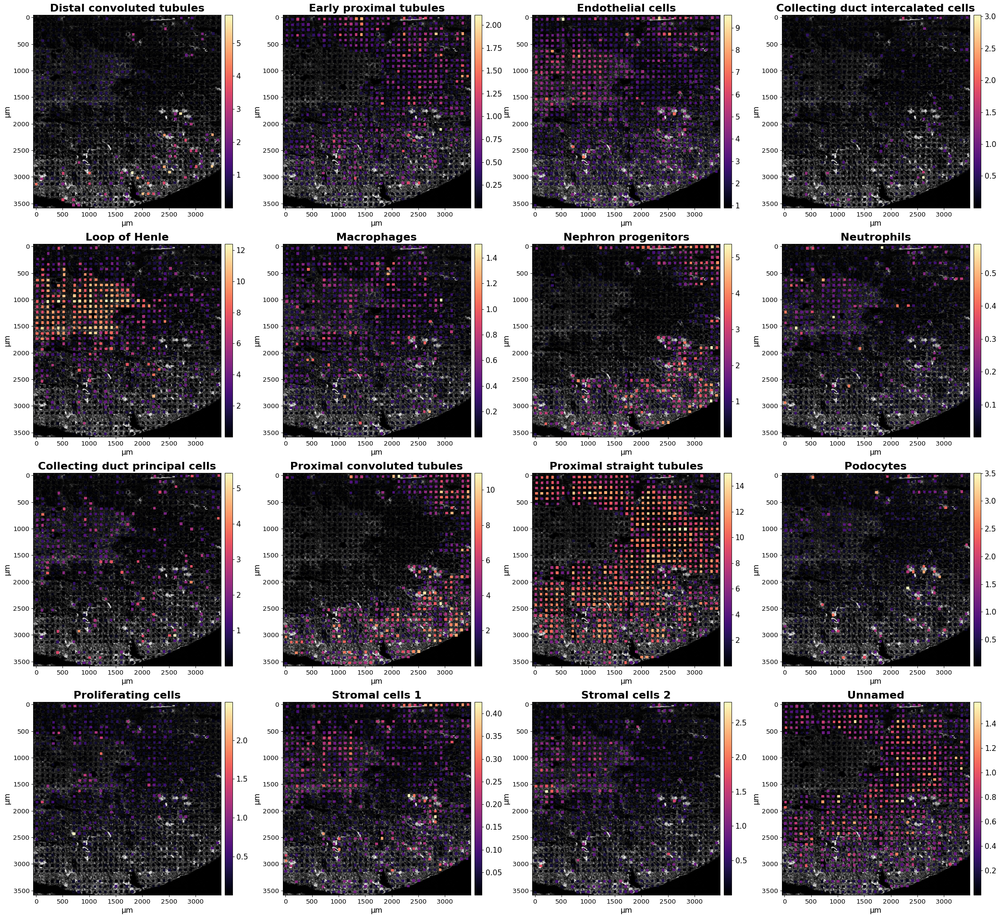

In [30]:
db.pl.spatial(stadata, 
              keys=celltypes, 
              groupby='id',
              image_key='phalloidin',
              cmap='magma', alpha=1, clb_pad=0.05, figsize=(6.5,6),
              #savepath="figures/deconvolution/spatial_cell2location_celltypes.pdf"
             )

### Cell type proportions

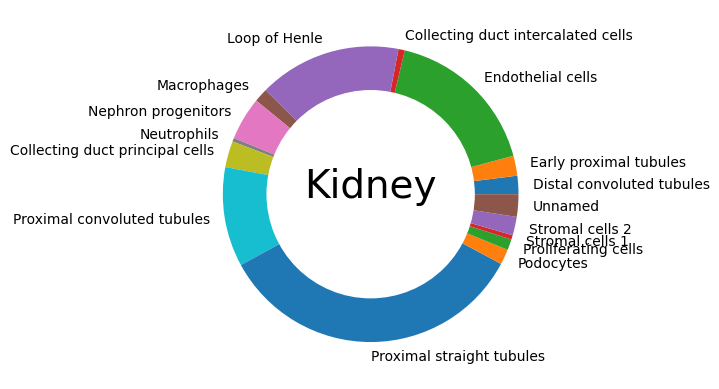

In [14]:
sum_props = stadata.obsm['q05_cell_abundance_w_sf'].sum()
sum_props.index = stadata.uns['mod']['factor_names']
perc = sum_props / sum_props.sum() * 100

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

plt.pie(perc, labels=perc.index, 
        #colors=cm.tab20(np.arange(len(perc)))
       )

p = plt.gcf()
p.gca().add_artist(my_circle)

plt.title("Kidney", y=0.47, fontsize=28)

savepath = "figures/deconvolution/pie_Kidney_cell2location.pdf"
Path(os.path.dirname(savepath)).mkdir(parents=True, exist_ok=True)
plt.savefig(savepath)
plt.show()

### Rename abbreviations

In [ ]:
stadata.obsm['q05_cell_abundance_w_sf_renamed'] = stadata.obsm['q05_cell_abundance_w_sf'].copy()
stadata.obsm['q05_cell_abundance_w_sf_renamed'].columns = stadata.uns['mod']['factor_names']
stadata.obsm['q05_cell_abundance_w_sf_renamed'].rename(columns=rename_dict, inplace=True)

In [ ]:
stadata.obsm['q05_cell_abundance_w_sf_renamed']

,Distal convoluted tubules,Early proximal tubules,Endothelial cells,Collecting duct intercalated cells,Loop of Henle,Macrophages,Nephron progenitors,Neutrophils,Collecting duct principal cells,Proximal convoluted tubules,Proximal straight tubules,Podocytes,Proliferating cells,Stromal cells 1,Stromal cells 2,Unnamed
14x4x37_46_B3,0.024316,1.144630,2.547978,0.047486,1.367485,0.071822,0.141330,0.035746,0.028371,0.523491,12.323746,0.302450,0.324227,0.182194,0.537294,1.491556
14x3x37_46_B3,0.121597,0.575258,2.174353,0.026221,3.046745,0.393310,0.045359,0.019776,0.089243,0.025168,8.782580,0.260843,0.393109,0.009635,0.143676,0.891828
14x2x37_46_B3,0.030680,0.659605,2.513519,0.043109,1.417074,0.197508,0.535534,0.052869,0.055311,2.188698,6.279277,0.100524,0.099953,0.018445,0.168333,0.306648
14x1x37_46_B3,0.845154,1.712739,4.034226,0.006084,0.938758,0.147216,1.556284,0.045292,0.156879,4.276396,5.851793,0.165312,0.038987,0.117770,0.150820,0.295653
12x15x37_46_B3,0.248817,0.018887,4.150455,0.024050,7.666419,0.333102,0.130146,0.112871,0.653802,0.020976,0.028207,0.267770,0.842625,0.126399,0.789714,0.007741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18x27x37_46_B3,0.073489,0.234352,1.223990,0.001721,4.260192,0.028725,1.603964,0.022341,0.076442,2.786304,2.407195,0.037108,0.010297,0.207730,0.069907,0.100007
18x22x37_46_B3,0.002920,1.003316,1.115503,0.024527,0.132594,0.101801,0.119507,0.008975,0.006530,0.460637,9.709562,0.154110,0.140178,0.005612,0.023798,1.049971
18x21x37_46_B3,0.039272,0.252997,3.924840,0.149288,1.821250,0.577041,0.045044,0.020720,0.047220,0.007928,8.269696,0.063830,0.384684,0.020349,0.256198,0.426081
18x24x37_46_B3,0.055035,0.615572,1.969823,0.067747,0.380420,0.072013,0.552831,0.008264,0.012545,2.180457,9.742497,0.177756,0.051505,0.026899,0.110958,0.523051


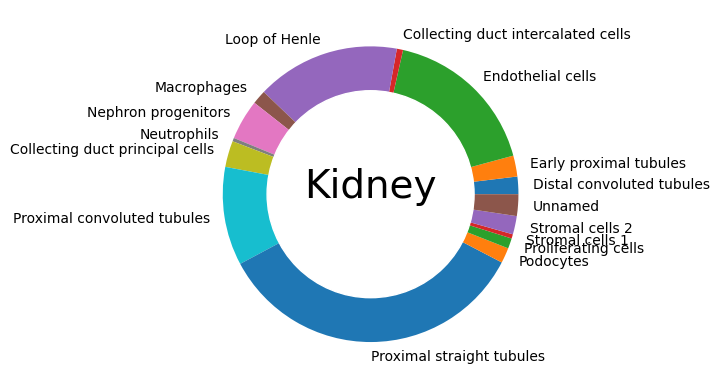

In [ ]:
sum_props = stadata.obsm['q05_cell_abundance_w_sf_renamed'].sum()
perc = sum_props / sum_props.sum() * 100

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

plt.pie(perc, labels=perc.index, 
        #colors=cm.tab20(np.arange(len(perc)))
       )

p = plt.gcf()
p.gca().add_artist(my_circle)

plt.title("Kidney", y=0.47, fontsize=28)
plt.savefig("figures/deconvolution/pie_Kidney_cell2location_renamed.pdf")
plt.show()

## Cell2location downstream analysis

Based on this tutorial: https://github.com/BayraktarLab/cell2location/blob/master/docs/notebooks/cell2location_tutorial.ipynb

### Identifying discrete tissue regions by Leiden clustering

In [15]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(stadata, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(stadata, key_added="region_cluster", resolution=1.1)

# # add region as categorical variable
# stadata.obs["region_cluster"] = stadata.obs["leiden"].astype("category")

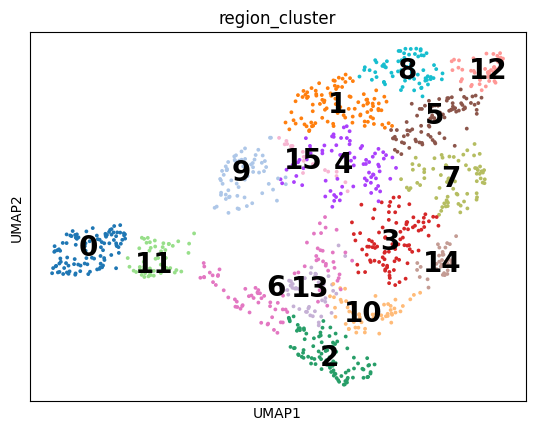

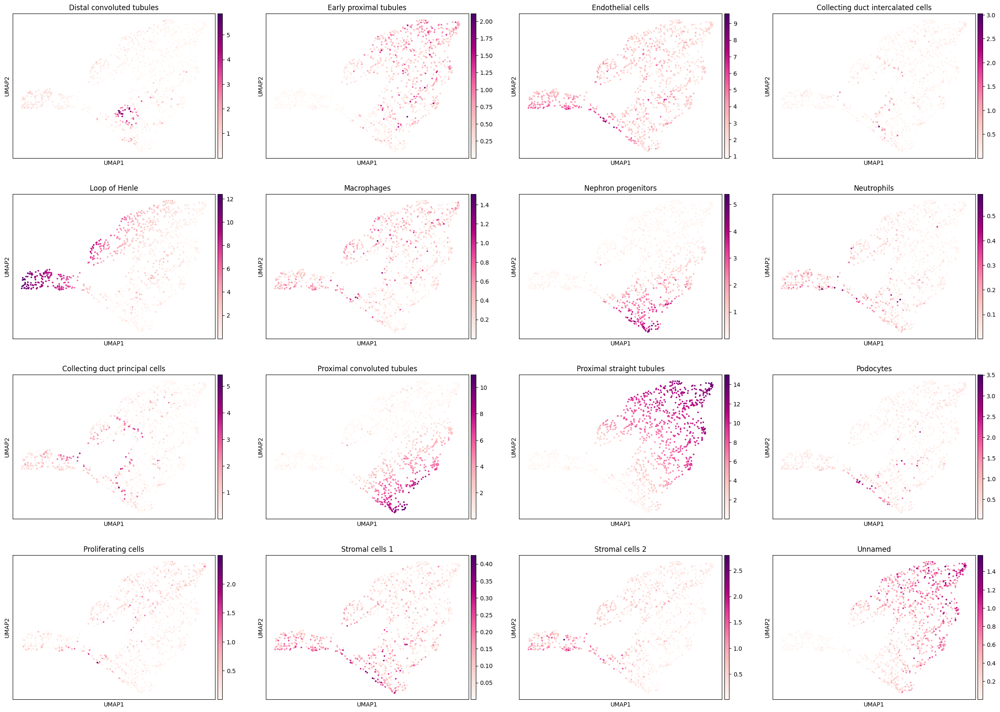

In [16]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(stadata, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
sc.pl.umap(stadata, color=['region_cluster'], size=30,
           color_map = 'RdPu', ncols = 2, legend_loc='on data',
           legend_fontsize=20)
sc.pl.umap(stadata, color=celltypes, size=30,
           color_map = 'RdPu', ncols = 4,
           legend_fontsize=20)

### Identifying cellular compartments / tissue zones using matrix factorisation (NMF) 

In [17]:
run_name

'out/deconvolution/cell2location_map'

In [18]:
from cell2location import run_colocation
res_dict, stadata = run_colocation(
    stadata, 
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'id', # columns in adata_vis.obs that identifies sample           
      'n_restarts': 3 # number of training restarts
    },
    export_args={'path': f'{run_name}/CoLocatedComb/'}
) 

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_1116locations_16factors
Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 'hires'
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_1116locations_16factors
Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 'hires'


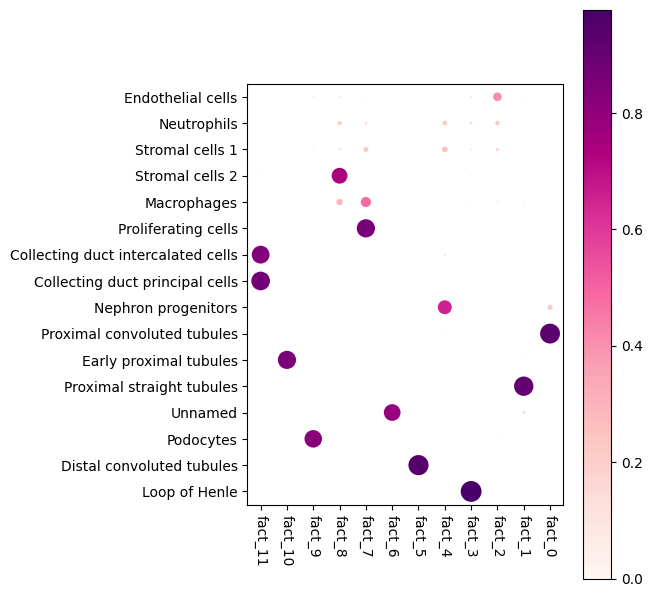

In [19]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

In [20]:
factornames = [elem for elem in stadata.obs.columns if elem.startswith('mean_nUMI_factorsfact_')]

## Plot spatial representation of factors

Saving figure to file figures/deconvolution/spatial_cell2location_factors.pdf
Saved.


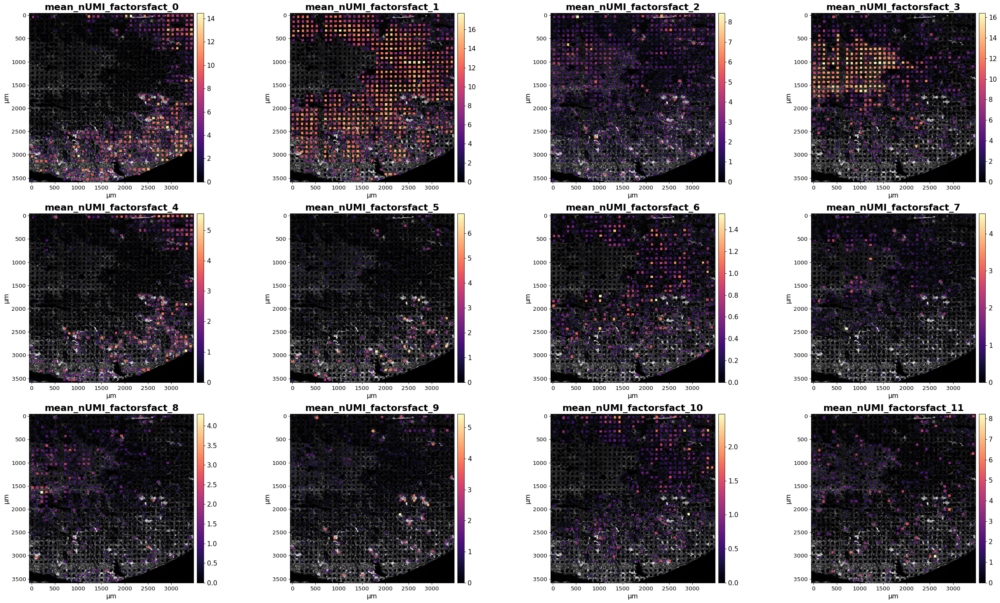

In [21]:
db.pl.spatial(stadata, 
              keys=factornames, 
              groupby='id',
              image_key='phalloidin',
              cmap='magma', alpha=1,
              savepath="figures/deconvolution/spatial_cell2location_factors.pdf"
             )

### Estimate cell-type specific expression of every gene in the spatial data (needed for NCEM) 

In [22]:
# Compute expected expression per cell type
expected_dict = st_model.module.model.compute_expected_per_cell_type(
    st_model.samples["post_sample_q05"], st_model.adata_manager
)

In [23]:
# Add to anndata layers
for i, n in enumerate(st_model.factor_names_):
    stadata.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
stadata.write(adata_file)
adata_file

'out/deconvolution/cell2location_map/sp.h5ad'

#### Plotting cell-type specific expression of genes in spatial coordinates

In [24]:
stadata.layers

Layers with keys: counts, norm_counts, DCT, Early PT, Endo, IC, LOH, Macro, NP, Neutro, PC, PCT, PST, Podo, Proliferating, Stroma 1, Stroma 2, Unnamed

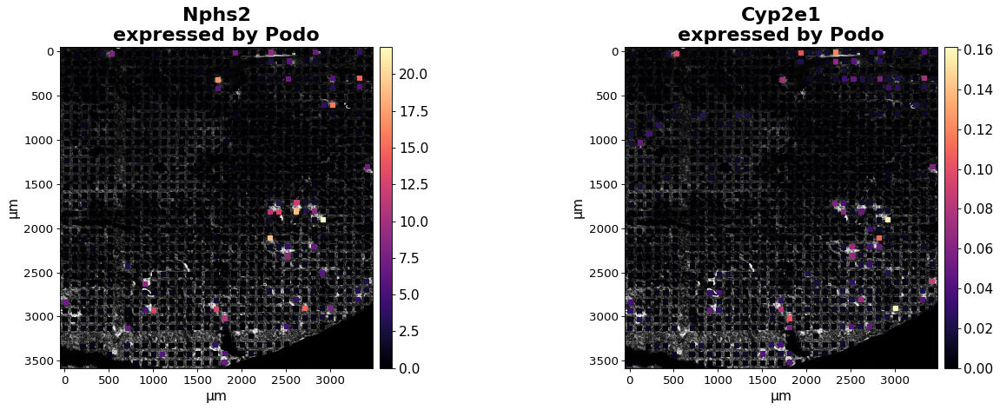

In [25]:
celltype = 'Podo'
genes = ['Nphs2', 'Cyp2e1']
headers = ["{}\nexpressed by {}".format(g, celltype) for g in genes]

db.pl.spatial(stadata, 
              layer=celltype,
              keys=genes, 
              header_names=headers,
              groupby='id',
              image_key='phalloidin',
              cmap='magma', alpha=1, clb_pad=-0.2
             )

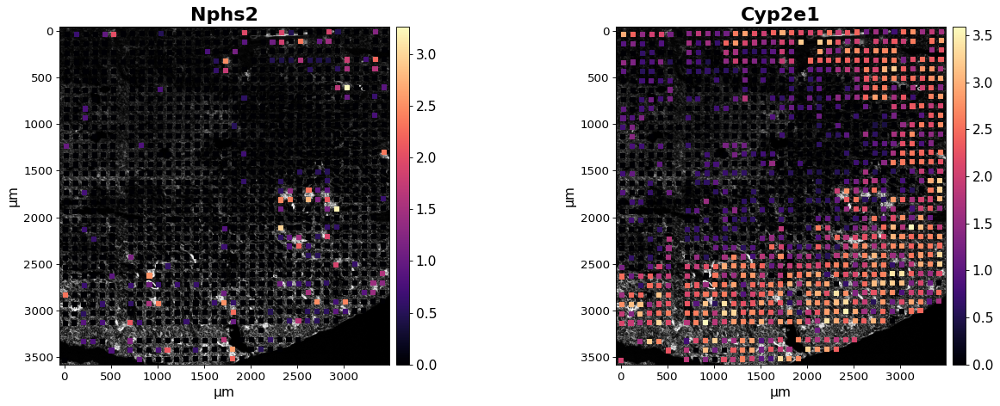

In [26]:
db.pl.spatial(stadata, 
              layer=None,
              keys=['Nphs2', 'Cyp2e1'], 
              groupby='id',
              image_key='phalloidin',
              cmap='magma', alpha=1
             )

## Save deconvolved adata

In [28]:
results_file = os.path.join(data_dir, "Kidney_37_46_B3_adata_cell2location.h5ad")
stadata.write(results_file)